In [ ]:
!pip install datasets==3.6.0 unsloth trl vllm triton==3.2.0 -qq

In [85]:
from unsloth import FastLanguageModel, PatchFastRL
from trl import GRPOConfig, GRPOTrainer
from vllm import SamplingParams
PatchFastRL("GRPO", FastLanguageModel)

from typing import Union
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from datasets import load_dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from tqdm import tqdm
import re

In [86]:
# Constants

lora_rank = 64

system_prompt = """
  Respond in the following format:
  <reasoning>
  ...
  </reasoning>
  <answer>
  ...
  </answer>
  """

bert_model_name = 'answerdotai/ModernBERT-base'

In [87]:
dataset = load_dataset('openai/gsm8k', 'main', trust_remote_code=True)

## Загрузка модели и токенизатора

In [89]:
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name="Qwen/Qwen2.5-0.5B-Instruct",
    max_seq_length = 1024,
    load_in_4bit = True,
    fast_inference = True, # Enable vLLM fast inference
    max_lora_rank = lora_rank,
    dtype=torch.float16,
)

model = FastLanguageModel.get_peft_model(
    model,
    r = lora_rank,
    target_modules = [
        "q_proj", "k_proj", "v_proj", "o_proj",
        "gate_proj", "up_proj", "down_proj",
    ],
    lora_alpha = lora_rank,
    random_state = 42,
)

==((====))==  Unsloth 2025.7.3: Fast Qwen2 patching. Transformers: 4.53.1. vLLM: 0.8.5.post1.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.6.0+cu124. CUDA: 7.5. CUDA Toolkit: 12.4. Triton: 3.2.0
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.29.post2. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
Unsloth: vLLM loading unsloth/qwen2.5-0.5b-instruct-unsloth-bnb-4bit with actual GPU utilization = 28.66%
Unsloth: Your GPU has CUDA compute capability 7.5 with VRAM = 14.74 GB.
Unsloth: Using conservativeness = 1.0. Chunked prefill tokens = 1024. Num Sequences = 160.
Unsloth: vLLM's KV Cache can use up to 3.7 GB. Also swap space = 0 GB.
WARNING 07-13 16:31:58 [config.py:2972] Casting torch.bfloat16 to torch.float16.
INFO 07-13 16:32:29 [config.py:717] This model supports multiple tasks: {'generate', 'embed', 'reward', 

Loading safetensors checkpoint shards:   0% Completed | 0/1 [00:00<?, ?it/s]


Loading safetensors checkpoint shards:   0% Completed | 0/1 [00:00<?, ?it/s]


INFO 07-13 16:33:02 [punica_selector.py:18] Using PunicaWrapperGPU.
INFO 07-13 16:33:02 [model_runner.py:1140] Model loading took 0.5747 GiB and 22.590219 seconds
INFO 07-13 16:33:10 [worker.py:287] Memory profiling takes 7.38 seconds
INFO 07-13 16:33:10 [worker.py:287] the current vLLM instance can use total_gpu_memory (14.74GiB) x gpu_memory_utilization (0.29) = 4.22GiB
INFO 07-13 16:33:10 [worker.py:287] model weights take 0.57GiB; non_torch_memory takes 0.00GiB; PyTorch activation peak memory takes 0.86GiB; the rest of the memory reserved for KV Cache is 2.79GiB.
INFO 07-13 16:33:11 [executor_base.py:112] # cuda blocks: 15218, # CPU blocks: 0
INFO 07-13 16:33:11 [executor_base.py:117] Maximum concurrency for 1024 tokens per request: 237.78x
INFO 07-13 16:33:11 [model_runner.py:1450] Capturing cudagraphs for decoding. This may lead to unexpected consequences if the model is not static. To run the model in eager mode, set 'enforce_eager=True' or use '--enforce-eager' in the CLI. If o

Capturing CUDA graph shapes:   0%|          | 0/23 [00:00<?, ?it/s]

INFO 07-13 16:34:10 [model_runner.py:1592] Graph capturing finished in 59 secs, took 0.33 GiB
INFO 07-13 16:34:10 [llm_engine.py:437] init engine (profile, create kv cache, warmup model) took 68.17 seconds
Unsloth: Just some info: will skip parsing ['pre_feedforward_layernorm', 'post_feedforward_layernorm', 'k_norm', 'q_norm']
Unsloth: Just some info: will skip parsing ['pre_feedforward_layernorm', 'post_feedforward_layernorm', 'k_norm', 'q_norm']


Unsloth 2025.7.3 patched 24 layers with 24 QKV layers, 24 O layers and 24 MLP layers.


## Анализ датасета

In [90]:
bert_tokenizer = AutoTokenizer.from_pretrained(bert_model_name, trust_remote_code=True)

In [91]:
# Preprocessing for getting max length of the target (with reasoning and answer tokens) for tokenizer

def extract_answer(answer: str) -> Union[str, None]:
    """Get only the answer after '####' tokens (in gsm8k)"""
    return answer.split('####')[-1].strip().replace(',', '') if '####' in answer else None

def extract_reasoning(answer):
  return answer.split('####')[0].strip() if '####' in answer else None

def simple_preproc_for_get_len(example):
    clear_answer = extract_answer(example['answer'])
    raw_reasoning = extract_reasoning(example['answer'])
    reasoning = f'<reasoning>\n{raw_reasoning}\n</reasoning>\n<answer>\n{clear_answer}\n</answer>'

    return {'text': reasoning}

dataset_for_calc_len = dataset.map(simple_preproc_for_get_len)

Map:   0%|          | 0/7473 [00:00<?, ? examples/s]

Map:   0%|          | 0/1319 [00:00<?, ? examples/s]

In [92]:
max_len_train = 0
for sample in dataset_for_calc_len['train']:
  # exclude [CLS] and [SEP] tokens from raw len calculation
  max_len_train = max(max_len_train, len(tokenizer(sample['text'])['input_ids'][1:-1]))

max_len_test = 0
for sample in dataset_for_calc_len['test']:
  # exclude [CLS] and [SEP] tokens from raw len calculation
  max_len_test = max(max_len_test, len(tokenizer(sample['text'])['input_ids'][1:-1]))

max_len_train, max_len_test
# max is 464 => 512 will be enough for us

(464, 424)

In [93]:
# Preprocessing for using BERT for regression

def preproc_for_bert_regression(example):
    raw_reasoning = extract_reasoning(example['answer'])
    reasoning = f'<reasoning>\n{raw_reasoning}\n</reasoning>'
    target = len(tokenizer(reasoning)['input_ids'][1:-1])

    return {
        'text': example['question'],
        'label': float(target)
    }

dataset_for_bert_regression = dataset.map(preproc_for_bert_regression)

Map:   0%|          | 0/7473 [00:00<?, ? examples/s]

Map:   0%|          | 0/1319 [00:00<?, ? examples/s]

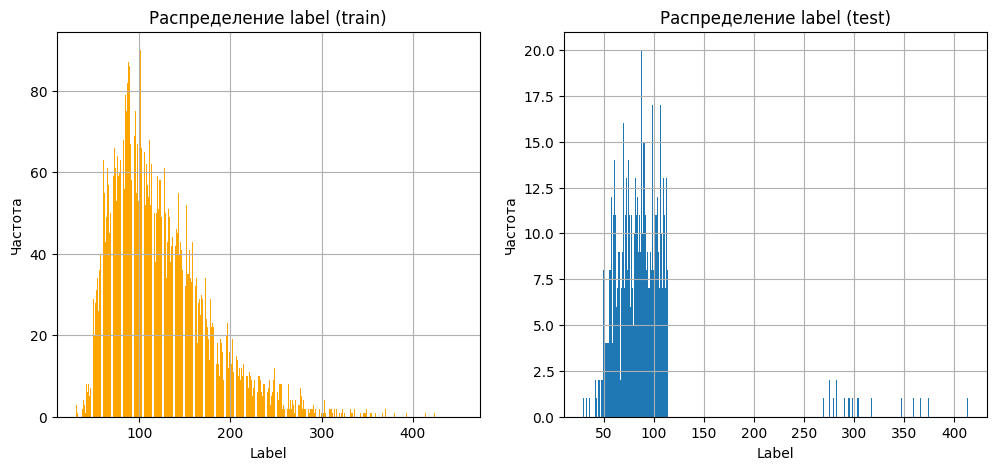

In [94]:
train_labels = dataset_for_bert_regression['train']['label']
test_labels = dataset_for_bert_regression['test']['label']

train_label_counts = pd.Series(train_labels).value_counts()
test_label_counts = pd.Series(test_labels).value_counts()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.bar(train_label_counts.index, train_label_counts.values, color='orange')
ax1.set_title('Распределение label (train)')
ax1.set_xlabel('Label')
ax1.set_ylabel('Частота')
ax1.grid()

ax2.bar(test_label_counts.index, test_label_counts.values)
ax2.set_title('Распределение label (test)')
ax2.set_xlabel('Label')
ax2.set_ylabel('Частота')
ax2.grid()

plt.show()

In [95]:
pd.Series(train_labels).mean(), pd.Series(test_labels).mean()

(np.float64(123.47490967482939), np.float64(125.86125852918877))

In [ ]:
# Как видим, средняя длина "идеального" ответа: около 120
# Интересно заметить, что модели после GRPO алайнмента в основном сходились именно к этой средней длине ответа

## Обучение ModernBERT для задачи регрессии

In [96]:
def tokenize_func(examples):
    return bert_tokenizer(examples['text'], padding='max_length', truncation=True, max_length=512)

tokenized_dataset = dataset_for_bert_regression.map(tokenize_func, batched=True)

Map:   0%|          | 0/7473 [00:00<?, ? examples/s]

Map:   0%|          | 0/1319 [00:00<?, ? examples/s]

In [97]:
tokenized_dataset = tokenized_dataset.remove_columns(['question', 'answer', 'text'])
tokenized_dataset.set_format('torch')

In [98]:
train_set = tokenized_dataset['train']
test_set = tokenized_dataset['test']

In [99]:
# for regression using num_labels=1

bert_model = AutoModelForSequenceClassification.from_pretrained(bert_model_name, num_labels=1, trust_remote_code=True).to('cuda')

Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [100]:
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = predictions.flatten()

    mse = mean_squared_error(labels, predictions)
    mae = mean_absolute_error(labels, predictions)
    rmse = np.sqrt(mse)

    return {'mse': mse, 'mae': mae, 'rmse': rmse}

In [101]:
data_collator = DataCollatorWithPadding(tokenizer=bert_tokenizer)

In [102]:
# BERT training params

bert_training_args = TrainingArguments(
    output_dir='regression_output',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=10,
    weight_decay=0.01,
    save_strategy='epoch',
    eval_strategy='epoch',
    load_best_model_at_end=True,
    metric_for_best_model='mae',
    greater_is_better=False,
    fp16=True,
    logging_steps=50,
    report_to='none'
)

bert_trainer = Trainer(
    model=bert_model,
    args=bert_training_args,
    train_dataset=train_set,
    eval_dataset=test_set,
    processing_class=bert_tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

In [103]:
bert_trainer.train()

==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 7,473 | Num Epochs = 10 | Total steps = 9,350
O^O/ \_/ \    Batch size per device = 8 | Gradient accumulation steps = 1
\        /    Data Parallel GPUs = 1 | Total batch size (8 x 1 x 1) = 8
 "-____-"     Trainable parameters = 149,605,633 of 149,605,633 (100.00% trained)


Epoch,Training Loss,Validation Loss,Mse,Mae,Rmse
1,6345.342500,6063.069336,6063.068848,59.219673,77.865710
2,4097.649700,4152.884766,4152.884277,46.938541,64.442876
3,3451.153100,3235.136475,3235.135986,41.045609,56.878256
4,2480.390300,2769.870361,2769.870361,37.397011,52.629558
5,2365.362300,2451.576172,2451.576172,35.185772,49.513394
6,2221.332800,2228.708740,2228.708740,33.318684,47.209202
7,2120.970600,2129.019043,2129.019043,32.235264,46.141294
8,2164.256400,1997.792847,1997.792847,31.424753,44.696676
9,1488.194800,1976.649414,1976.649414,31.361471,44.459526
10,1595.102800,1954.801025,1954.801025,31.285490,44.213132


TrainOutput(global_step=9350, training_loss=3062.665400651738, metrics={'train_runtime': 3785.6432, 'train_samples_per_second': 19.74, 'train_steps_per_second': 2.47, 'total_flos': 2.546465729301504e+16, 'train_loss': 3062.665400651738, 'epoch': 10.0})

## Evaluate модели с изменяющимся промптом

In [114]:
# Dataset preparing for evaluation

def extract_answer(answer: str) -> Union[str, None]:
  """Get only the answer after '####' tokens (in gsm8k)"""
  return answer.split('####')[-1].strip().replace(',', '') if '####' in answer else None


def preproc(example):
  messages = [
          {'role': 'system', 'content': system_prompt},
          {'role': 'user', 'content': example['question']}
  ]
  clear_answer = extract_answer(example['answer'])

  return {
      'prompt': messages,
      'answer': clear_answer
  }

dataset = load_dataset('openai/gsm8k', 'main', trust_remote_code=True)
dataset = dataset.map(preproc)

Map:   0%|          | 0/7473 [00:00<?, ? examples/s]

Map:   0%|          | 0/1319 [00:00<?, ? examples/s]

In [125]:
def get_reasoning_length(question: str) -> int:
    """Predict reasoning length based on input question using bert"""
    inputs = bert_tokenizer(question, return_tensors='pt', padding=True, truncation=True, max_length=512)
    inputs = {k: v.to('cuda') for k, v in inputs.items()}

    with torch.no_grad():
        outputs = bert_model(**inputs)
        predicted_length = outputs.logits.squeeze().item()

    min_reasoning_tokens = 10
    max_reasoning_tokens = 400
    reasoning_tokens = int(np.clip(predicted_length, min_reasoning_tokens, max_reasoning_tokens))

    return reasoning_tokens


def create_changing_system_prompt(question: str) -> str:
    """Get system_prompt with changing length based on bert output"""
    reasoning_length = get_reasoning_length(question)

    new_prompt = f"""
      Respond in the following format:
      <reasoning>
      reasoning for {reasoning_length} tokens
      </reasoning>
      <answer>
      ...
      </answer>
      """
    return new_prompt

In [131]:
# Auxiliary functions for evaluation

def get_answer(content: str) -> Union[str, None]:
    """Get only the answer between <answer>ANSWER</answer> tokens"""
    if '<answer>' in content and '</answer>' in content:
        return content.split('<answer>')[1].split('</answer>')[0].strip()
    return None


def get_reasoning(content: str) -> Union[str, None]:
    """Get reasoning between <reasoning>REASONING</reasoning> tokens"""
    if '<reasoning>' in content and '</reasoning>' in content:
        return content.split('<reasoning>')[1].split('</reasoning>')[0].strip()
    return None


def check_format(text: str) -> bool:
    """Check the correctness of the model's answer format for calculating format_accuracy"""
    pattern = r'^\s*<reasoning>.*?</reasoning>\s*<answer>.*?</answer>\s*$'
    return bool(re.match(pattern, text, re.S))


def extract_num_from_answer(text: str) -> Union[float, None]:
    """Get last number between <answer>ANSWER</answer> tokens for calculating accuracy"""
    answer = get_answer(text)
    if answer:
        all_digits = re.findall(r'-?\d+(?:\.\d+)?', answer.replace(',', ''))
        if len(all_digits) > 0:
            return float(all_digits[-1])
        return None
    return None


def extract_last_num_from_answer(text: str) -> Union[float, None]:
    """Get last number in text for calculating accuracy (use if format of answer is wrong)"""
    all_digits = re.findall(r'-?\d+(?:\.\d+)?', text.replace(',', ''))
    if len(all_digits) > 0:
        return float(all_digits[-1])
    return None

In [132]:
def evaluate_model(model, tokenizer, dataset):
    sampling_params = SamplingParams(
        temperature=0.8,
        top_p=0.9,
        max_tokens=4096
    )

    ans_correct_right_format = 0
    format_correct = 0
    ans_correct_wrong_format = 0
    reasoning_length_stats = []
    for sample in tqdm(dataset):
        question = sample['question']
        target = float(sample['answer'])

        changing_prompt = create_changing_system_prompt(question)
        messages = [
            {'role': 'system', 'content': changing_prompt},
            {'role': 'user', 'content': question}
        ]

        text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        out = model.fast_generate(
            [text], sampling_params=sampling_params, lora_request=None
        )[0].outputs[0].text

        # if out in right format (as in prompt):
        pred_in_right_format = extract_num_from_answer(out)
        # if out in wrong format (free way of answer, not following prompt instructions):
        pred_in_wrong_format = extract_last_num_from_answer(out)

        if pred_in_right_format == target: ans_correct_right_format += 1
        if pred_in_wrong_format == target: ans_correct_wrong_format += 1
        if check_format(out): format_correct += 1

        reasoning = get_reasoning(out)
        if reasoning:
            actual_length = len(reasoning.split())
            expected_length = get_reasoning_length(question)
            reasoning_length_stats.append({
                'expected': expected_length,
                'actual': actual_length,
                'ratio': actual_length / expected_length if expected_length > 0 else 0
            })

    accuracy_ans_right_format = ans_correct_right_format / len(dataset)
    accuracy_ans_wrong_format = ans_correct_wrong_format / len(dataset)
    format_accuracy = format_correct / len(dataset)

    if reasoning_length_stats:
        avg_expected = np.mean([stat['expected'] for stat in reasoning_length_stats])
        avg_actual = np.mean([stat['actual'] for stat in reasoning_length_stats])
        avg_ratio = np.mean([stat['ratio'] for stat in reasoning_length_stats])
        print(f'Reasoning length stats: Expected -> {avg_expected}, \
                                        Actual -> {avg_actual}, \
                                        Ratio -> {avg_ratio}')

    print(f'baseline: Accuracy in right format -> {accuracy_ans_right_format}, \
                            Accuracy in wrong format -> {accuracy_ans_wrong_format}, \
                            Right format percent -> {format_accuracy}')

In [133]:
evaluate_model(model, tokenizer, dataset['test'])

  0%|          | 0/1319 [00:00<?, ?it/s]

Processed prompts:   0%|          | 0/2 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 1/1319 [00:01<32:55,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 2/1319 [00:03<39:28,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 3/1319 [00:05<41:35,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 4/1319 [00:05<28:46,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 5/1319 [00:07<28:57,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  0%|          | 6/1319 [00:08<25:34,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 7/1319 [00:09<29:07,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 8/1319 [00:12<38:34,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 9/1319 [00:14<39:47,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 10/1319 [00:16<38:09,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 11/1319 [00:18<42:00,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 12/1319 [00:19<35:59,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 13/1319 [00:20<29:46,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 14/1319 [00:22<34:45,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 15/1319 [00:24<37:43,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|          | 16/1319 [00:26<42:24,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|▏         | 17/1319 [00:27<31:24,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|▏         | 18/1319 [00:28<29:33,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  1%|▏         | 19/1319 [00:29<27:27,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 20/1319 [00:32<42:44,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 21/1319 [00:34<42:42,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 22/1319 [00:35<35:56,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 23/1319 [00:36<27:44,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 24/1319 [00:38<33:11,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 25/1319 [00:38<27:09,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 26/1319 [00:40<26:38,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 27/1319 [00:41<24:52,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 28/1319 [00:42<24:01,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 29/1319 [00:43<24:23,  1.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 30/1319 [00:46<37:25,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 31/1319 [00:47<33:22,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  2%|▏         | 32/1319 [00:49<33:32,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 33/1319 [00:49<27:09,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 34/1319 [00:52<39:09,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 35/1319 [00:54<36:39,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 36/1319 [00:55<31:08,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 37/1319 [00:57<39:07,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 38/1319 [00:59<37:23,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 39/1319 [01:01<41:30,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 40/1319 [01:05<54:00,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 41/1319 [01:06<42:56,  2.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 42/1319 [01:09<47:53,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 43/1319 [01:10<38:01,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 44/1319 [01:10<28:18,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 45/1319 [01:11<25:56,  1.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  3%|▎         | 46/1319 [01:13<30:38,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▎         | 47/1319 [01:15<35:48,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▎         | 48/1319 [01:16<32:18,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▎         | 49/1319 [01:17<28:42,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 50/1319 [01:18<26:38,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 51/1319 [01:19<23:45,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 52/1319 [01:20<22:53,  1.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 53/1319 [01:21<24:37,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 54/1319 [01:23<28:25,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 55/1319 [01:25<33:10,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 56/1319 [01:26<26:56,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 57/1319 [01:27<28:15,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 58/1319 [01:30<38:16,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  4%|▍         | 59/1319 [01:31<33:24,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 60/1319 [01:32<28:28,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 61/1319 [01:33<28:24,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 62/1319 [01:37<40:18,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 63/1319 [01:37<30:42,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 64/1319 [01:40<40:56,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▍         | 65/1319 [01:41<34:07,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 66/1319 [01:43<35:50,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 67/1319 [01:44<31:40,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 68/1319 [01:45<31:02,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 69/1319 [01:47<34:30,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 70/1319 [01:48<27:40,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 71/1319 [01:50<31:58,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  5%|▌         | 72/1319 [01:51<30:12,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 73/1319 [01:54<38:26,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 74/1319 [01:54<29:18,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 75/1319 [01:56<31:49,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 76/1319 [01:58<35:00,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 77/1319 [02:01<43:32,  2.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 78/1319 [02:03<41:30,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 79/1319 [02:04<36:20,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 80/1319 [02:05<30:05,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 81/1319 [02:06<26:43,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▌         | 82/1319 [02:07<26:02,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▋         | 83/1319 [02:07<19:44,  1.04it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▋         | 84/1319 [02:08<19:27,  1.06it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  6%|▋         | 85/1319 [02:11<32:32,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 86/1319 [02:19<1:10:41,  3.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 87/1319 [02:20<51:46,  2.52s/it]  

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 88/1319 [02:20<40:39,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 89/1319 [02:21<30:57,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 90/1319 [02:22<31:32,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 91/1319 [02:24<29:25,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 92/1319 [02:24<25:35,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 93/1319 [02:25<21:37,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 94/1319 [02:28<34:09,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 95/1319 [02:31<41:33,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 96/1319 [02:33<43:29,  2.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 97/1319 [02:36<44:01,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  7%|▋         | 98/1319 [02:37<37:15,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 99/1319 [02:37<31:12,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 100/1319 [02:39<31:26,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 101/1319 [02:40<28:54,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 102/1319 [02:41<25:18,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 103/1319 [02:42<24:21,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 104/1319 [02:44<29:34,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 105/1319 [02:45<27:54,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 106/1319 [02:46<22:38,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 107/1319 [02:47<23:53,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 108/1319 [02:49<25:19,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 109/1319 [02:50<25:21,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 110/1319 [02:52<31:47,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 111/1319 [02:54<34:45,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  8%|▊         | 112/1319 [03:02<1:12:14,  3.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▊         | 113/1319 [03:03<54:47,  2.73s/it]  

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▊         | 114/1319 [03:04<41:54,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▊         | 115/1319 [03:07<51:22,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 116/1319 [03:08<41:50,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 117/1319 [03:09<33:50,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 118/1319 [03:10<28:13,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 119/1319 [03:11<27:18,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 120/1319 [03:13<34:15,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 121/1319 [03:15<32:38,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 122/1319 [03:16<31:49,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 123/1319 [03:17<24:09,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 124/1319 [03:19<28:10,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

  9%|▉         | 125/1319 [03:20<26:15,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 126/1319 [03:21<25:38,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 127/1319 [03:22<23:46,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 128/1319 [03:23<25:19,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 129/1319 [03:25<24:52,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 130/1319 [03:28<38:20,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|▉         | 131/1319 [03:29<33:55,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 132/1319 [03:31<32:06,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 133/1319 [03:33<34:07,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 134/1319 [03:33<27:24,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 135/1319 [03:34<21:36,  1.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 136/1319 [03:34<19:10,  1.03it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 137/1319 [03:35<19:25,  1.01it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 10%|█         | 138/1319 [03:38<31:29,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 139/1319 [03:40<29:02,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 140/1319 [03:42<35:04,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 141/1319 [03:44<33:09,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 142/1319 [03:44<28:17,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 143/1319 [03:45<24:40,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 144/1319 [03:46<24:09,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 145/1319 [03:48<28:22,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 146/1319 [03:49<22:26,  1.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 147/1319 [03:50<22:33,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█         | 148/1319 [03:51<24:03,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█▏        | 149/1319 [03:52<22:17,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█▏        | 150/1319 [03:53<18:45,  1.04it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 11%|█▏        | 151/1319 [03:55<24:27,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 152/1319 [03:58<36:32,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 153/1319 [04:00<34:15,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 154/1319 [04:02<34:26,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 155/1319 [04:03<30:56,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 156/1319 [04:04<30:40,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 157/1319 [04:05<24:09,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 158/1319 [04:06<21:32,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 159/1319 [04:06<19:27,  1.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 160/1319 [04:08<21:04,  1.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 161/1319 [04:08<17:11,  1.12it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 162/1319 [04:10<23:27,  1.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 163/1319 [04:11<25:03,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 12%|█▏        | 164/1319 [04:12<22:41,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 165/1319 [04:13<20:26,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 166/1319 [04:14<17:29,  1.10it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 167/1319 [04:14<16:16,  1.18it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 168/1319 [04:16<23:16,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 169/1319 [04:17<21:17,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 170/1319 [04:18<20:23,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 171/1319 [04:19<19:26,  1.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 172/1319 [04:19<15:17,  1.25it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 173/1319 [04:27<56:25,  2.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 174/1319 [04:29<49:47,  2.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 175/1319 [04:30<37:18,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 176/1319 [04:33<45:26,  2.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 177/1319 [04:35<40:02,  2.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 13%|█▎        | 178/1319 [04:42<1:12:27,  3.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▎        | 179/1319 [04:45<1:06:24,  3.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▎        | 180/1319 [04:45<48:36,  2.56s/it]  

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▎        | 181/1319 [04:48<45:59,  2.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 182/1319 [04:49<40:05,  2.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 183/1319 [04:49<29:33,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 184/1319 [04:51<32:50,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 185/1319 [04:55<45:29,  2.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 186/1319 [04:56<35:06,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 187/1319 [05:03<1:07:04,  3.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 188/1319 [05:05<52:52,  2.80s/it]  

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 189/1319 [05:07<52:10,  2.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 190/1319 [05:09<48:46,  2.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 14%|█▍        | 191/1319 [05:10<37:36,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 192/1319 [05:11<30:19,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 193/1319 [05:13<35:00,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 194/1319 [05:15<33:35,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 195/1319 [05:15<25:08,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 196/1319 [05:17<26:57,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▍        | 197/1319 [05:18<27:41,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 198/1319 [05:20<26:30,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 199/1319 [05:21<27:15,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 200/1319 [05:23<26:49,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 201/1319 [05:24<27:22,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 202/1319 [05:25<23:24,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 203/1319 [05:26<21:18,  1.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 15%|█▌        | 204/1319 [05:28<26:05,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 205/1319 [05:28<22:14,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 206/1319 [05:31<28:13,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 207/1319 [05:32<29:22,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 208/1319 [05:33<22:22,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 209/1319 [05:34<20:19,  1.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 210/1319 [05:42<59:22,  3.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 211/1319 [05:48<1:18:02,  4.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 212/1319 [05:50<1:01:01,  3.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 213/1319 [05:50<46:45,  2.54s/it]  

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▌        | 214/1319 [05:53<47:46,  2.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▋        | 215/1319 [05:55<44:34,  2.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▋        | 216/1319 [05:57<44:25,  2.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 16%|█▋        | 217/1319 [05:58<35:50,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 218/1319 [05:59<27:02,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 219/1319 [06:00<23:49,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 220/1319 [06:04<41:17,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 221/1319 [06:05<35:43,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 222/1319 [06:07<35:03,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 223/1319 [06:08<30:06,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 224/1319 [06:09<25:02,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 225/1319 [06:10<21:57,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 226/1319 [06:10<18:17,  1.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 227/1319 [06:12<21:16,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 228/1319 [06:15<31:32,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 229/1319 [06:18<37:22,  2.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 17%|█▋        | 230/1319 [06:19<32:06,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 231/1319 [06:20<30:07,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 232/1319 [06:21<26:07,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 233/1319 [06:22<26:05,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 234/1319 [06:23<22:30,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 235/1319 [06:24<19:42,  1.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 236/1319 [06:25<16:32,  1.09it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 237/1319 [06:27<22:54,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 238/1319 [06:27<19:26,  1.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 239/1319 [06:28<17:24,  1.03it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 240/1319 [06:29<19:14,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 241/1319 [06:32<27:22,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 242/1319 [06:34<31:12,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 243/1319 [06:35<26:37,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 18%|█▊        | 244/1319 [06:37<27:32,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▊        | 245/1319 [06:39<29:29,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▊        | 246/1319 [06:43<44:10,  2.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▊        | 247/1319 [06:44<39:15,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 248/1319 [06:46<34:35,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 249/1319 [06:47<28:58,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 250/1319 [06:48<25:59,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 251/1319 [06:50<29:23,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 252/1319 [06:51<24:31,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 253/1319 [06:52<22:57,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 254/1319 [06:53<24:49,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 255/1319 [06:55<24:47,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 256/1319 [06:56<21:55,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 19%|█▉        | 257/1319 [06:58<28:07,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 258/1319 [07:01<33:21,  1.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 259/1319 [07:02<28:16,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 260/1319 [07:02<23:01,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 261/1319 [07:04<25:07,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 262/1319 [07:04<20:13,  1.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|█▉        | 263/1319 [07:05<18:17,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 264/1319 [07:07<23:06,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 265/1319 [07:10<29:50,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 266/1319 [07:13<35:51,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 267/1319 [07:16<45:45,  2.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 268/1319 [07:17<36:15,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 269/1319 [07:18<29:25,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 20%|██        | 270/1319 [07:19<24:44,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 271/1319 [07:20<21:50,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 272/1319 [07:21<22:24,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 273/1319 [07:22<20:40,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 274/1319 [07:24<25:30,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 275/1319 [07:25<22:25,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 276/1319 [07:27<28:25,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 277/1319 [07:30<33:42,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 278/1319 [07:32<32:34,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 279/1319 [07:32<25:26,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██        | 280/1319 [07:33<20:18,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██▏       | 281/1319 [07:34<18:53,  1.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██▏       | 282/1319 [07:35<20:32,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 21%|██▏       | 283/1319 [07:38<28:46,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 284/1319 [07:42<38:32,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 285/1319 [07:43<33:43,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 286/1319 [07:43<26:48,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 287/1319 [07:44<24:02,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 288/1319 [07:48<32:51,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 289/1319 [07:49<29:41,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 290/1319 [07:51<32:58,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 291/1319 [07:52<27:14,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 292/1319 [07:53<25:07,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 293/1319 [07:54<21:01,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 294/1319 [07:56<26:13,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 295/1319 [07:57<21:42,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 22%|██▏       | 296/1319 [07:59<23:45,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 297/1319 [08:02<33:21,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 298/1319 [08:02<26:16,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 299/1319 [08:03<22:05,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 300/1319 [08:11<55:26,  3.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 301/1319 [08:12<42:59,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 302/1319 [08:16<53:16,  3.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 303/1319 [08:17<42:02,  2.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 304/1319 [08:19<38:26,  2.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 305/1319 [08:20<33:47,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 306/1319 [08:21<26:38,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 307/1319 [08:22<23:52,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 308/1319 [08:23<22:16,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 23%|██▎       | 309/1319 [08:25<22:38,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▎       | 310/1319 [08:27<25:37,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▎       | 311/1319 [08:28<24:24,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▎       | 312/1319 [08:29<23:45,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▎       | 313/1319 [08:31<24:10,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 314/1319 [08:34<33:24,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 315/1319 [08:38<45:27,  2.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 316/1319 [08:39<37:27,  2.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 317/1319 [08:41<33:31,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 318/1319 [08:42<26:23,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 319/1319 [08:44<30:46,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 320/1319 [08:45<25:26,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 321/1319 [08:46<22:49,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 322/1319 [08:46<18:04,  1.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 24%|██▍       | 323/1319 [08:48<20:07,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 324/1319 [08:50<27:05,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 325/1319 [08:54<36:52,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 326/1319 [08:55<33:36,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 327/1319 [08:56<25:06,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 328/1319 [08:57<24:50,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▍       | 329/1319 [09:01<34:51,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 330/1319 [09:02<28:25,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 331/1319 [09:03<26:02,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 332/1319 [09:04<21:27,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 333/1319 [09:04<18:12,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 334/1319 [09:06<24:03,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 335/1319 [09:09<27:01,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 25%|██▌       | 336/1319 [09:10<25:30,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 337/1319 [09:11<24:26,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 338/1319 [09:12<20:59,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 339/1319 [09:14<24:49,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 340/1319 [09:17<33:53,  2.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 341/1319 [09:18<25:02,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 342/1319 [09:21<32:38,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 343/1319 [09:22<30:29,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 344/1319 [09:24<28:00,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 345/1319 [09:25<24:46,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▌       | 346/1319 [09:26<21:05,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▋       | 347/1319 [09:28<25:36,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▋       | 348/1319 [09:29<25:33,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 26%|██▋       | 349/1319 [09:34<37:28,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 350/1319 [09:35<33:21,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 351/1319 [09:37<30:50,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 352/1319 [09:37<25:20,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 353/1319 [09:38<20:20,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 354/1319 [09:40<22:54,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 355/1319 [09:42<25:15,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 356/1319 [09:43<26:00,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 357/1319 [09:44<23:30,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 358/1319 [09:46<25:49,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 359/1319 [09:47<21:42,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 360/1319 [09:51<31:42,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 361/1319 [09:52<27:36,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 27%|██▋       | 362/1319 [09:53<24:18,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 363/1319 [09:54<23:16,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 364/1319 [09:55<21:40,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 365/1319 [09:56<19:41,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 366/1319 [09:57<16:08,  1.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 367/1319 [09:58<16:44,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 368/1319 [09:59<15:53,  1.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 369/1319 [09:59<14:56,  1.06it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 370/1319 [10:07<47:18,  2.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 371/1319 [10:08<38:38,  2.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 372/1319 [10:10<34:58,  2.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 373/1319 [10:12<32:15,  2.05s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 374/1319 [10:15<39:54,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 28%|██▊       | 375/1319 [10:16<31:43,  2.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▊       | 376/1319 [10:18<28:54,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▊       | 377/1319 [10:19<25:50,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▊       | 378/1319 [10:20<24:17,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▊       | 379/1319 [10:21<20:33,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 380/1319 [10:21<16:55,  1.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 381/1319 [10:24<23:23,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 382/1319 [10:26<25:36,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 383/1319 [10:28<27:10,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 384/1319 [10:29<23:25,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 385/1319 [10:29<18:22,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 386/1319 [10:31<21:37,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 387/1319 [10:33<21:38,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 388/1319 [10:34<20:54,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 29%|██▉       | 389/1319 [10:35<19:20,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 390/1319 [10:37<21:27,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 391/1319 [10:37<18:05,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 392/1319 [10:39<19:55,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 393/1319 [10:40<18:31,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 394/1319 [10:43<28:21,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|██▉       | 395/1319 [10:46<35:25,  2.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 396/1319 [10:47<28:18,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 397/1319 [10:50<30:33,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 398/1319 [10:51<26:34,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 399/1319 [10:51<21:50,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 400/1319 [10:52<17:05,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 401/1319 [10:52<14:10,  1.08it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 30%|███       | 402/1319 [11:00<47:17,  3.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 403/1319 [11:02<38:34,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 404/1319 [11:04<39:43,  2.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 405/1319 [11:06<33:28,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 406/1319 [11:06<25:27,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 407/1319 [11:08<28:26,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 408/1319 [11:10<26:35,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 409/1319 [11:13<32:17,  2.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 410/1319 [11:18<44:05,  2.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 411/1319 [11:21<45:22,  3.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███       | 412/1319 [11:22<35:53,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███▏      | 413/1319 [11:22<27:40,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███▏      | 414/1319 [11:26<35:05,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 31%|███▏      | 415/1319 [11:29<40:58,  2.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 416/1319 [11:31<36:11,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 417/1319 [11:32<28:39,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 418/1319 [11:33<24:48,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 419/1319 [11:35<25:09,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 420/1319 [11:36<22:53,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 421/1319 [11:38<27:02,  1.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 422/1319 [11:39<22:32,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 423/1319 [11:41<23:14,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 424/1319 [11:46<39:37,  2.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 425/1319 [11:48<37:33,  2.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 426/1319 [11:51<40:16,  2.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 427/1319 [11:53<34:25,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 32%|███▏      | 428/1319 [11:53<26:12,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 429/1319 [11:55<26:01,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 430/1319 [11:57<25:37,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 431/1319 [11:59<30:12,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 432/1319 [12:00<25:54,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 433/1319 [12:01<21:33,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 434/1319 [12:03<21:57,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 435/1319 [12:11<51:37,  3.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 436/1319 [12:12<39:45,  2.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 437/1319 [12:12<30:10,  2.05s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 438/1319 [12:13<23:55,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 439/1319 [12:15<26:03,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 440/1319 [12:19<34:18,  2.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 33%|███▎      | 441/1319 [12:20<29:55,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▎      | 442/1319 [12:22<27:00,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▎      | 443/1319 [12:25<32:55,  2.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▎      | 444/1319 [12:28<36:39,  2.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▎      | 445/1319 [12:30<36:32,  2.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 446/1319 [12:32<32:04,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 447/1319 [12:34<33:27,  2.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 448/1319 [12:36<32:25,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 449/1319 [12:38<27:12,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 450/1319 [12:38<23:00,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 451/1319 [12:40<24:49,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 452/1319 [12:44<31:24,  2.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 453/1319 [12:44<24:12,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 454/1319 [12:52<51:51,  3.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 34%|███▍      | 455/1319 [12:53<38:17,  2.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 456/1319 [12:54<30:24,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 457/1319 [12:57<35:50,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 458/1319 [12:57<26:13,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 459/1319 [12:59<24:49,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 460/1319 [13:02<32:11,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▍      | 461/1319 [13:05<35:10,  2.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 462/1319 [13:10<46:56,  3.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 463/1319 [13:11<35:20,  2.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 464/1319 [13:12<28:39,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 465/1319 [13:14<27:32,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 466/1319 [13:14<22:38,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 467/1319 [13:17<27:39,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 35%|███▌      | 468/1319 [13:20<29:23,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 469/1319 [13:21<25:01,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 470/1319 [13:21<21:00,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 471/1319 [13:22<18:29,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 472/1319 [13:25<22:32,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 473/1319 [13:26<23:32,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 474/1319 [13:29<25:41,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 475/1319 [13:30<24:04,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 476/1319 [13:31<19:48,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 477/1319 [13:31<15:56,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▌      | 478/1319 [13:34<21:54,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▋      | 479/1319 [13:35<18:49,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▋      | 480/1319 [13:36<16:32,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 36%|███▋      | 481/1319 [13:36<14:28,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 482/1319 [13:38<16:07,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 483/1319 [13:38<14:17,  1.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 484/1319 [13:40<14:45,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 485/1319 [13:41<16:48,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 486/1319 [13:42<17:44,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 487/1319 [13:44<17:12,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 488/1319 [13:45<15:37,  1.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 489/1319 [13:46<16:27,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 490/1319 [13:46<12:58,  1.06it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 491/1319 [13:47<11:56,  1.16it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 492/1319 [13:49<17:01,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 493/1319 [13:50<17:12,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 37%|███▋      | 494/1319 [13:53<24:14,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 495/1319 [13:54<21:59,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 496/1319 [13:55<16:26,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 497/1319 [13:58<23:39,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 498/1319 [13:58<17:46,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 499/1319 [13:59<16:00,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 500/1319 [13:59<12:32,  1.09it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 501/1319 [14:00<12:58,  1.05it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 502/1319 [14:01<13:03,  1.04it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 503/1319 [14:02<13:05,  1.04it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 504/1319 [14:04<17:39,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 505/1319 [14:08<26:19,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 506/1319 [14:11<33:09,  2.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 38%|███▊      | 507/1319 [14:13<29:12,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▊      | 508/1319 [14:13<22:12,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▊      | 509/1319 [14:14<20:17,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▊      | 510/1319 [14:15<16:53,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▊      | 511/1319 [14:23<43:45,  3.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 512/1319 [14:24<36:29,  2.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 513/1319 [14:26<31:18,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 514/1319 [14:27<25:53,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 515/1319 [14:27<20:07,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 516/1319 [14:29<18:58,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 517/1319 [14:29<15:29,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 518/1319 [14:31<16:33,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 519/1319 [14:33<21:03,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 520/1319 [14:34<20:06,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 39%|███▉      | 521/1319 [14:35<18:47,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 522/1319 [14:37<18:32,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 523/1319 [14:38<18:33,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 524/1319 [14:39<16:42,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 525/1319 [14:42<23:34,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 526/1319 [14:44<22:25,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|███▉      | 527/1319 [14:45<21:22,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 528/1319 [14:47<20:21,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 529/1319 [14:52<35:07,  2.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 530/1319 [14:53<31:08,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 531/1319 [14:58<37:48,  2.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 532/1319 [15:00<37:51,  2.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 533/1319 [15:09<59:08,  4.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 40%|████      | 534/1319 [15:10<44:52,  3.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 535/1319 [15:12<41:25,  3.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 536/1319 [15:15<39:31,  3.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 537/1319 [15:16<31:07,  2.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 538/1319 [15:17<25:05,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 539/1319 [15:17<19:12,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 540/1319 [15:18<17:22,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 541/1319 [15:22<26:26,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 542/1319 [15:24<26:25,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 543/1319 [15:25<24:40,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████      | 544/1319 [15:26<18:58,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████▏     | 545/1319 [15:26<15:14,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████▏     | 546/1319 [15:27<13:24,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 41%|████▏     | 547/1319 [15:27<10:54,  1.18it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 548/1319 [15:29<13:08,  1.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 549/1319 [15:30<15:13,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 550/1319 [15:32<17:10,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 551/1319 [15:35<22:18,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 552/1319 [15:37<22:39,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 553/1319 [15:37<18:34,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 554/1319 [15:40<22:04,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 555/1319 [15:42<22:47,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 556/1319 [15:42<18:20,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 557/1319 [15:43<15:09,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 558/1319 [15:45<19:06,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 559/1319 [15:46<17:06,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 42%|████▏     | 560/1319 [15:49<23:29,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 561/1319 [15:50<18:00,  1.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 562/1319 [15:51<18:57,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 563/1319 [15:53<18:50,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 564/1319 [15:58<33:00,  2.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 565/1319 [16:02<37:32,  2.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 566/1319 [16:03<29:05,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 567/1319 [16:05<27:17,  2.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 568/1319 [16:07<29:09,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 569/1319 [16:09<28:48,  2.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 570/1319 [16:11<26:10,  2.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 571/1319 [16:12<21:44,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 572/1319 [16:13<19:14,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 43%|████▎     | 573/1319 [16:15<20:37,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▎     | 574/1319 [16:15<15:49,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▎     | 575/1319 [16:17<17:50,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▎     | 576/1319 [16:19<18:07,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▎     | 577/1319 [16:20<17:03,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 578/1319 [16:22<19:49,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 579/1319 [16:23<17:30,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 580/1319 [16:23<13:46,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 581/1319 [16:25<13:48,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 582/1319 [16:27<17:27,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 583/1319 [16:28<15:20,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 584/1319 [16:29<16:26,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 585/1319 [16:29<13:01,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 44%|████▍     | 586/1319 [16:31<15:18,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 587/1319 [16:32<15:19,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 588/1319 [16:33<11:38,  1.05it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 589/1319 [16:34<13:04,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 590/1319 [16:35<13:00,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 591/1319 [16:39<22:03,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 592/1319 [16:40<18:38,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▍     | 593/1319 [16:42<20:59,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 594/1319 [16:45<26:13,  2.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 595/1319 [16:47<24:10,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 596/1319 [16:47<18:32,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 597/1319 [16:49<21:40,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 598/1319 [16:52<25:05,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 599/1319 [16:57<34:49,  2.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 45%|████▌     | 600/1319 [16:58<28:24,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 601/1319 [16:59<23:52,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 602/1319 [17:00<21:02,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 603/1319 [17:03<23:41,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 604/1319 [17:11<45:13,  3.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 605/1319 [17:13<37:22,  3.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 606/1319 [17:14<29:40,  2.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 607/1319 [17:21<48:37,  4.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 608/1319 [17:23<37:55,  3.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 609/1319 [17:23<28:16,  2.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▌     | 610/1319 [17:24<23:00,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▋     | 611/1319 [17:25<19:18,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▋     | 612/1319 [17:26<17:41,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 46%|████▋     | 613/1319 [17:27<17:17,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 614/1319 [17:28<13:43,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 615/1319 [17:29<13:02,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 616/1319 [17:31<15:32,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 617/1319 [17:31<13:08,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 618/1319 [17:35<21:35,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 619/1319 [17:38<26:08,  2.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 620/1319 [17:39<20:19,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 621/1319 [17:40<19:20,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 622/1319 [17:41<16:40,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 623/1319 [17:42<16:22,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 624/1319 [17:44<15:35,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 625/1319 [17:44<13:24,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 47%|████▋     | 626/1319 [17:45<13:02,  1.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 627/1319 [17:48<18:08,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 628/1319 [17:49<17:59,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 629/1319 [17:50<15:08,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 630/1319 [17:51<14:50,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 631/1319 [17:53<15:06,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 632/1319 [17:57<26:33,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 633/1319 [17:58<20:48,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 634/1319 [18:00<20:23,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 635/1319 [18:00<15:52,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 636/1319 [18:02<16:14,  1.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 637/1319 [18:04<17:16,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 638/1319 [18:05<16:39,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 48%|████▊     | 639/1319 [18:05<12:57,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▊     | 640/1319 [18:06<10:57,  1.03it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▊     | 641/1319 [18:08<16:01,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▊     | 642/1319 [18:10<18:25,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▊     | 643/1319 [18:13<21:11,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 644/1319 [18:15<21:10,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 645/1319 [18:16<20:05,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 646/1319 [18:17<16:05,  1.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 647/1319 [18:17<12:24,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 648/1319 [18:18<11:14,  1.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 649/1319 [18:19<10:31,  1.06it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 650/1319 [18:20<11:32,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 651/1319 [18:22<13:12,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 49%|████▉     | 652/1319 [18:25<20:30,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 653/1319 [18:27<20:39,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 654/1319 [18:28<18:37,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 655/1319 [18:30<18:05,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 656/1319 [18:30<14:27,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 657/1319 [18:31<13:15,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 658/1319 [18:34<18:41,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|████▉     | 659/1319 [18:35<17:33,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 660/1319 [18:41<30:19,  2.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 661/1319 [18:41<22:15,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 662/1319 [18:49<41:23,  3.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 663/1319 [18:51<34:07,  3.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 664/1319 [18:52<27:56,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 665/1319 [18:52<21:14,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 50%|█████     | 666/1319 [18:55<24:04,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 667/1319 [18:56<20:23,  1.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 668/1319 [18:58<18:03,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 669/1319 [18:59<18:35,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 670/1319 [19:00<16:25,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 671/1319 [19:02<15:15,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 672/1319 [19:03<13:50,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 673/1319 [19:05<15:50,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 674/1319 [19:06<16:47,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████     | 675/1319 [19:08<16:20,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████▏    | 676/1319 [19:10<19:15,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████▏    | 677/1319 [19:13<23:34,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████▏    | 678/1319 [19:15<20:42,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 51%|█████▏    | 679/1319 [19:15<16:26,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 680/1319 [19:16<13:40,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 681/1319 [19:18<15:25,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 682/1319 [19:20<17:51,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 683/1319 [19:23<21:09,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 684/1319 [19:24<17:40,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 685/1319 [19:24<14:15,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 686/1319 [19:26<15:14,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 687/1319 [19:27<13:46,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 688/1319 [19:35<35:20,  3.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 689/1319 [19:36<27:12,  2.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 690/1319 [19:39<27:36,  2.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 691/1319 [19:40<24:24,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 52%|█████▏    | 692/1319 [19:41<20:03,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 693/1319 [19:42<17:07,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 694/1319 [19:46<22:54,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 695/1319 [19:47<21:12,  2.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 696/1319 [19:48<15:56,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 697/1319 [19:49<16:34,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 698/1319 [19:51<15:12,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 699/1319 [19:52<13:59,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 700/1319 [19:52<11:38,  1.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 701/1319 [19:54<14:05,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 702/1319 [19:56<13:49,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 703/1319 [19:59<21:22,  2.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 704/1319 [20:00<15:54,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 53%|█████▎    | 705/1319 [20:00<13:22,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▎    | 706/1319 [20:02<14:49,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▎    | 707/1319 [20:03<13:18,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▎    | 708/1319 [20:05<14:14,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 709/1319 [20:05<11:36,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 710/1319 [20:08<15:32,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 711/1319 [20:11<19:44,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 712/1319 [20:11<16:27,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 713/1319 [20:20<36:33,  3.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 714/1319 [20:20<27:09,  2.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 715/1319 [20:21<21:59,  2.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 716/1319 [20:23<20:11,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 717/1319 [20:24<17:09,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 54%|█████▍    | 718/1319 [20:26<18:13,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 719/1319 [20:29<20:19,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 720/1319 [20:29<16:43,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 721/1319 [20:30<14:05,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 722/1319 [20:33<19:29,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 723/1319 [20:34<14:36,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 724/1319 [20:35<13:51,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▍    | 725/1319 [20:37<14:18,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 726/1319 [20:40<21:22,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 727/1319 [20:44<26:34,  2.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 728/1319 [20:45<19:30,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 729/1319 [20:46<16:58,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 730/1319 [20:47<15:53,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 731/1319 [20:49<16:38,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 55%|█████▌    | 732/1319 [20:51<16:10,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 733/1319 [20:54<20:02,  2.05s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 734/1319 [20:54<15:21,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 735/1319 [20:55<12:36,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 736/1319 [20:57<15:03,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 737/1319 [20:58<15:17,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 738/1319 [21:01<16:54,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 739/1319 [21:03<18:49,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 740/1319 [21:05<19:56,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▌    | 741/1319 [21:07<19:18,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▋    | 742/1319 [21:08<15:44,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▋    | 743/1319 [21:09<13:34,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▋    | 744/1319 [21:10<11:50,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 56%|█████▋    | 745/1319 [21:11<12:31,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 746/1319 [21:13<12:49,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 747/1319 [21:20<31:01,  3.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 748/1319 [21:22<26:23,  2.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 749/1319 [21:26<29:52,  3.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 750/1319 [21:34<44:11,  4.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 751/1319 [21:35<33:35,  3.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 752/1319 [21:37<27:34,  2.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 753/1319 [21:37<21:15,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 754/1319 [21:39<20:23,  2.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 755/1319 [21:44<26:30,  2.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 756/1319 [21:44<20:34,  2.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 757/1319 [21:46<20:13,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 57%|█████▋    | 758/1319 [21:47<17:08,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 759/1319 [21:48<14:57,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 760/1319 [21:51<17:52,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 761/1319 [21:54<20:14,  2.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 762/1319 [21:55<15:46,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 763/1319 [21:55<12:46,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 764/1319 [21:58<16:17,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 765/1319 [21:59<13:37,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 766/1319 [21:59<11:51,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 767/1319 [22:01<12:34,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 768/1319 [22:02<11:15,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 769/1319 [22:04<13:12,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 770/1319 [22:06<16:12,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 58%|█████▊    | 771/1319 [22:07<12:15,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▊    | 772/1319 [22:09<14:05,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▊    | 773/1319 [22:10<12:54,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▊    | 774/1319 [22:11<11:51,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 775/1319 [22:15<20:15,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 776/1319 [22:16<16:49,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 777/1319 [22:17<14:32,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 778/1319 [22:25<31:03,  3.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 779/1319 [22:27<27:05,  3.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 780/1319 [22:30<27:02,  3.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 781/1319 [22:31<21:00,  2.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 782/1319 [22:32<16:55,  1.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 783/1319 [22:33<14:40,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 59%|█████▉    | 784/1319 [22:33<11:13,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 785/1319 [22:35<13:23,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 786/1319 [22:36<11:54,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 787/1319 [22:38<14:23,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 788/1319 [22:43<21:12,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 789/1319 [22:43<15:49,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 790/1319 [22:44<13:50,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|█████▉    | 791/1319 [22:47<18:10,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 792/1319 [22:49<17:16,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 793/1319 [22:51<18:09,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 794/1319 [22:53<16:58,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 795/1319 [22:54<14:03,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 796/1319 [22:55<12:13,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 60%|██████    | 797/1319 [22:56<11:30,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 798/1319 [22:56<09:16,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 799/1319 [23:00<16:06,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 800/1319 [23:02<15:32,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 801/1319 [23:04<16:23,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 802/1319 [23:06<18:17,  2.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 803/1319 [23:07<14:35,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 804/1319 [23:12<23:48,  2.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 805/1319 [23:13<17:39,  2.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 806/1319 [23:14<14:55,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████    | 807/1319 [23:16<16:57,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████▏   | 808/1319 [23:19<18:18,  2.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████▏   | 809/1319 [23:27<33:39,  3.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████▏   | 810/1319 [23:28<24:47,  2.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 61%|██████▏   | 811/1319 [23:33<30:43,  3.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 812/1319 [23:38<34:48,  4.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 813/1319 [23:42<35:04,  4.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 814/1319 [23:44<29:04,  3.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 815/1319 [23:47<27:39,  3.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 816/1319 [23:49<24:30,  2.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 817/1319 [23:50<19:01,  2.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 818/1319 [23:52<17:25,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 819/1319 [24:00<32:26,  3.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 820/1319 [24:01<25:09,  3.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 821/1319 [24:03<22:19,  2.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 822/1319 [24:03<16:26,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 823/1319 [24:04<13:34,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 62%|██████▏   | 824/1319 [24:06<14:21,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 825/1319 [24:08<14:53,  1.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 826/1319 [24:16<30:17,  3.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 827/1319 [24:17<24:39,  3.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 828/1319 [24:18<19:24,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 829/1319 [24:19<15:36,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 830/1319 [24:20<13:49,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 831/1319 [24:22<14:36,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 832/1319 [24:24<14:45,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 833/1319 [24:28<18:50,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 834/1319 [24:31<20:39,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 835/1319 [24:31<15:18,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 836/1319 [24:34<19:03,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 63%|██████▎   | 837/1319 [24:35<15:37,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▎   | 838/1319 [24:39<18:23,  2.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▎   | 839/1319 [24:41<18:29,  2.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▎   | 840/1319 [24:43<16:57,  2.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 841/1319 [24:44<14:04,  1.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 842/1319 [24:44<12:03,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 843/1319 [24:45<10:31,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 844/1319 [24:46<09:25,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 845/1319 [24:48<10:00,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 846/1319 [24:48<08:00,  1.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 847/1319 [24:49<08:23,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 848/1319 [24:50<08:06,  1.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 849/1319 [24:53<11:28,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 64%|██████▍   | 850/1319 [24:53<08:44,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 851/1319 [24:54<08:21,  1.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 852/1319 [24:55<08:01,  1.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 853/1319 [24:57<10:22,  1.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 854/1319 [24:59<11:05,  1.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 855/1319 [24:59<08:44,  1.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 856/1319 [25:07<25:01,  3.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▍   | 857/1319 [25:08<18:56,  2.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 858/1319 [25:10<18:58,  2.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 859/1319 [25:14<20:37,  2.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 860/1319 [25:16<19:03,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 861/1319 [25:17<15:27,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 862/1319 [25:22<24:18,  3.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 65%|██████▌   | 863/1319 [25:24<21:22,  2.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 864/1319 [25:25<15:50,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 865/1319 [25:26<13:08,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 866/1319 [25:28<14:20,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 867/1319 [25:30<14:48,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 868/1319 [25:32<14:48,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 869/1319 [25:33<11:55,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 870/1319 [25:35<12:19,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 871/1319 [25:36<12:26,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 872/1319 [25:42<21:27,  2.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▌   | 873/1319 [25:43<17:49,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▋   | 874/1319 [25:44<13:37,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▋   | 875/1319 [25:45<11:22,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▋   | 876/1319 [25:48<14:49,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 66%|██████▋   | 877/1319 [25:49<12:30,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 878/1319 [25:51<13:04,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 879/1319 [25:51<10:39,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 880/1319 [25:54<12:17,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 881/1319 [25:54<10:09,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 882/1319 [25:55<09:26,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 883/1319 [25:57<09:31,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 884/1319 [25:58<09:55,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 885/1319 [25:59<09:23,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 886/1319 [26:01<10:07,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 887/1319 [26:03<11:10,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 888/1319 [26:04<09:25,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 889/1319 [26:05<08:37,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 67%|██████▋   | 890/1319 [26:05<07:35,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 891/1319 [26:07<08:29,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 892/1319 [26:09<09:52,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 893/1319 [26:11<11:58,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 894/1319 [26:12<10:02,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 895/1319 [26:20<23:35,  3.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 896/1319 [26:21<20:21,  2.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 897/1319 [26:22<15:40,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 898/1319 [26:23<12:22,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 899/1319 [26:25<13:20,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 900/1319 [26:26<11:54,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 901/1319 [26:27<09:06,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 902/1319 [26:29<11:35,  1.67s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 68%|██████▊   | 903/1319 [26:30<09:42,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▊   | 904/1319 [26:31<08:55,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▊   | 905/1319 [26:33<09:55,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▊   | 906/1319 [26:35<11:59,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 907/1319 [26:37<12:28,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 908/1319 [26:38<10:10,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 909/1319 [26:39<09:03,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 910/1319 [26:42<11:42,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 911/1319 [26:43<10:15,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 912/1319 [26:44<10:17,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 913/1319 [26:45<08:06,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 914/1319 [26:48<13:00,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 915/1319 [26:49<11:11,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 69%|██████▉   | 916/1319 [26:51<11:34,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 917/1319 [26:54<13:18,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 918/1319 [26:54<10:33,  1.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 919/1319 [26:55<08:51,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 920/1319 [26:57<09:50,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 921/1319 [26:58<09:56,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 922/1319 [26:59<08:40,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|██████▉   | 923/1319 [27:01<10:04,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 924/1319 [27:03<10:33,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 925/1319 [27:05<11:40,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 926/1319 [27:08<13:30,  2.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 927/1319 [27:09<11:53,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 928/1319 [27:11<11:21,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 70%|███████   | 929/1319 [27:12<10:12,  1.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 930/1319 [27:13<08:53,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 931/1319 [27:13<07:15,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 932/1319 [27:14<06:40,  1.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 933/1319 [27:16<07:22,  1.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 934/1319 [27:17<07:50,  1.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 935/1319 [27:19<08:51,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 936/1319 [27:20<07:52,  1.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 937/1319 [27:21<08:25,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 938/1319 [27:24<10:33,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████   | 939/1319 [27:25<09:36,  1.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████▏  | 940/1319 [27:26<09:30,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████▏  | 941/1319 [27:27<07:27,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████▏  | 942/1319 [27:28<06:56,  1.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 71%|███████▏  | 943/1319 [27:36<20:08,  3.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 944/1319 [27:37<16:22,  2.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 945/1319 [27:38<13:49,  2.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 946/1319 [27:43<17:19,  2.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 947/1319 [27:43<13:03,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 948/1319 [27:43<09:57,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 949/1319 [27:45<10:13,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 950/1319 [27:46<07:40,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 951/1319 [27:54<20:10,  3.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 952/1319 [27:54<14:41,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 953/1319 [27:56<14:43,  2.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 954/1319 [27:58<12:34,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 955/1319 [28:01<14:07,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 72%|███████▏  | 956/1319 [28:06<20:32,  3.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 957/1319 [28:09<18:22,  3.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 958/1319 [28:10<15:16,  2.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 959/1319 [28:11<13:06,  2.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 960/1319 [28:12<11:00,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 961/1319 [28:15<12:35,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 962/1319 [28:17<12:46,  2.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 963/1319 [28:18<10:05,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 964/1319 [28:22<14:55,  2.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 965/1319 [28:24<12:17,  2.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 966/1319 [28:30<20:13,  3.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 967/1319 [28:32<16:51,  2.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 968/1319 [28:33<13:11,  2.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 73%|███████▎  | 969/1319 [28:35<14:01,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▎  | 970/1319 [28:36<11:00,  1.89s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▎  | 971/1319 [28:37<08:45,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▎  | 972/1319 [28:38<07:48,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 973/1319 [28:39<07:34,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 974/1319 [28:40<07:20,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 975/1319 [28:41<06:55,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 976/1319 [28:42<06:31,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 977/1319 [28:45<08:53,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 978/1319 [28:45<06:49,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 979/1319 [28:46<07:03,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 980/1319 [28:54<18:08,  3.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 981/1319 [28:55<14:04,  2.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 74%|███████▍  | 982/1319 [28:56<11:12,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 983/1319 [29:00<15:24,  2.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 984/1319 [29:02<13:25,  2.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 985/1319 [29:05<14:05,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 986/1319 [29:06<12:15,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 987/1319 [29:08<10:56,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 988/1319 [29:09<10:03,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▍  | 989/1319 [29:10<08:43,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 990/1319 [29:12<08:44,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 991/1319 [29:13<08:43,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 992/1319 [29:16<11:03,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 993/1319 [29:17<09:33,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 994/1319 [29:19<09:28,  1.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 75%|███████▌  | 995/1319 [29:22<10:51,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 996/1319 [29:23<10:14,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 997/1319 [29:27<12:26,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 998/1319 [29:28<10:11,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 999/1319 [29:29<09:28,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1000/1319 [29:35<16:15,  3.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1001/1319 [29:37<13:34,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1002/1319 [29:38<11:35,  2.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1003/1319 [29:41<12:49,  2.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1004/1319 [29:43<12:20,  2.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▌  | 1005/1319 [29:45<11:29,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▋  | 1006/1319 [29:48<13:16,  2.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▋  | 1007/1319 [29:51<12:58,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▋  | 1008/1319 [29:51<10:08,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 76%|███████▋  | 1009/1319 [29:52<08:30,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1010/1319 [29:54<08:22,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1011/1319 [29:56<09:29,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1012/1319 [29:59<10:54,  2.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1013/1319 [30:04<15:21,  3.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1014/1319 [30:05<12:48,  2.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1015/1319 [30:10<15:26,  3.05s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1016/1319 [30:11<12:46,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1017/1319 [30:14<12:44,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1018/1319 [30:15<11:07,  2.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1019/1319 [30:16<09:39,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1020/1319 [30:19<10:30,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1021/1319 [30:20<08:29,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 77%|███████▋  | 1022/1319 [30:28<17:52,  3.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1023/1319 [30:31<17:02,  3.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1024/1319 [30:33<15:54,  3.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1025/1319 [30:35<12:48,  2.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1026/1319 [30:36<10:21,  2.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1027/1319 [30:37<09:14,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1028/1319 [30:38<08:15,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1029/1319 [30:40<07:39,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1030/1319 [30:42<08:10,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1031/1319 [30:44<09:30,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1032/1319 [30:48<11:28,  2.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1033/1319 [30:51<12:56,  2.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1034/1319 [30:53<11:18,  2.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 78%|███████▊  | 1035/1319 [30:53<08:46,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▊  | 1036/1319 [31:01<17:05,  3.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▊  | 1037/1319 [31:02<12:48,  2.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▊  | 1038/1319 [31:03<10:19,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1039/1319 [31:05<10:43,  2.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1040/1319 [31:07<10:27,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1041/1319 [31:08<08:47,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1042/1319 [31:09<07:10,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1043/1319 [31:10<06:51,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1044/1319 [31:12<07:26,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1045/1319 [31:14<07:52,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1046/1319 [31:17<09:04,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1047/1319 [31:18<08:24,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 79%|███████▉  | 1048/1319 [31:20<07:24,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1049/1319 [31:21<06:48,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1050/1319 [31:21<05:10,  1.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1051/1319 [31:22<04:38,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1052/1319 [31:24<06:03,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1053/1319 [31:28<09:28,  2.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1054/1319 [31:30<08:40,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|███████▉  | 1055/1319 [31:31<08:12,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1056/1319 [31:33<08:02,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1057/1319 [31:34<07:23,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1058/1319 [31:37<08:34,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1059/1319 [31:38<07:02,  1.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1060/1319 [31:38<05:44,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 80%|████████  | 1061/1319 [31:43<10:34,  2.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1062/1319 [31:44<07:51,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1063/1319 [31:45<06:35,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1064/1319 [31:46<05:45,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1065/1319 [31:47<05:59,  1.42s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1066/1319 [31:49<06:05,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1067/1319 [31:55<11:42,  2.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1068/1319 [32:00<14:37,  3.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1069/1319 [32:02<13:19,  3.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1070/1319 [32:06<13:42,  3.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████  | 1071/1319 [32:07<11:39,  2.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████▏ | 1072/1319 [32:09<10:05,  2.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████▏ | 1073/1319 [32:11<09:30,  2.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 81%|████████▏ | 1074/1319 [32:12<08:04,  1.98s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1075/1319 [32:13<06:43,  1.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1076/1319 [32:16<07:47,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1077/1319 [32:18<07:51,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1078/1319 [32:21<09:27,  2.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1079/1319 [32:23<09:01,  2.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1080/1319 [32:25<08:12,  2.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1081/1319 [32:28<10:05,  2.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1082/1319 [32:29<07:47,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1083/1319 [32:29<06:02,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1084/1319 [32:33<08:05,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1085/1319 [32:34<07:24,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1086/1319 [32:35<05:57,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1087/1319 [32:35<04:36,  1.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 82%|████████▏ | 1088/1319 [32:37<04:49,  1.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1089/1319 [32:43<10:36,  2.77s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1090/1319 [32:44<08:52,  2.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1091/1319 [32:46<07:58,  2.10s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1092/1319 [32:48<07:54,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1093/1319 [32:56<14:23,  3.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1094/1319 [32:58<12:43,  3.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1095/1319 [33:00<10:45,  2.88s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1096/1319 [33:01<08:48,  2.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1097/1319 [33:04<08:55,  2.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1098/1319 [33:04<06:59,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1099/1319 [33:06<06:31,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1100/1319 [33:09<07:41,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 83%|████████▎ | 1101/1319 [33:10<06:58,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▎ | 1102/1319 [33:12<07:17,  2.02s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▎ | 1103/1319 [33:13<06:03,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▎ | 1104/1319 [33:16<06:56,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1105/1319 [33:17<06:16,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1106/1319 [33:19<06:36,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1107/1319 [33:20<05:41,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1108/1319 [33:23<06:19,  1.80s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1109/1319 [33:23<05:02,  1.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1110/1319 [33:24<03:59,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1111/1319 [33:25<04:27,  1.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1112/1319 [33:26<03:50,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1113/1319 [33:27<03:28,  1.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 84%|████████▍ | 1114/1319 [33:27<02:48,  1.22it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1115/1319 [33:28<02:39,  1.28it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1116/1319 [33:29<03:28,  1.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1117/1319 [33:31<03:57,  1.18s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1118/1319 [33:34<05:29,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1119/1319 [33:35<05:05,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1120/1319 [33:36<05:06,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▍ | 1121/1319 [33:39<05:40,  1.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1122/1319 [33:41<06:07,  1.86s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1123/1319 [33:45<07:59,  2.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1124/1319 [33:46<06:35,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1125/1319 [33:50<08:35,  2.66s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1126/1319 [33:51<06:51,  2.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 85%|████████▌ | 1127/1319 [33:53<07:20,  2.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1128/1319 [33:56<07:20,  2.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1129/1319 [33:57<05:55,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1130/1319 [34:01<08:40,  2.75s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1131/1319 [34:04<08:10,  2.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1132/1319 [34:05<06:44,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1133/1319 [34:08<07:58,  2.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1134/1319 [34:13<09:27,  3.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1135/1319 [34:13<07:14,  2.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1136/1319 [34:14<05:52,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▌ | 1137/1319 [34:15<04:25,  1.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▋ | 1138/1319 [34:20<07:44,  2.57s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▋ | 1139/1319 [34:22<07:19,  2.44s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 86%|████████▋ | 1140/1319 [34:24<07:25,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1141/1319 [34:25<05:44,  1.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1142/1319 [34:27<05:52,  1.99s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1143/1319 [34:28<04:43,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1144/1319 [34:29<03:50,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1145/1319 [34:30<03:55,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1146/1319 [34:31<03:59,  1.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1147/1319 [34:32<03:32,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1148/1319 [34:35<04:51,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1149/1319 [34:36<04:09,  1.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1150/1319 [34:38<04:30,  1.60s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1151/1319 [34:39<03:38,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1152/1319 [34:40<03:37,  1.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1153/1319 [34:41<03:32,  1.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 87%|████████▋ | 1154/1319 [34:47<07:12,  2.62s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1155/1319 [34:48<05:46,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1156/1319 [34:49<05:17,  1.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1157/1319 [34:50<04:32,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1158/1319 [34:54<05:55,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1159/1319 [34:56<05:45,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1160/1319 [35:01<07:49,  2.95s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1161/1319 [35:02<06:44,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1162/1319 [35:08<09:14,  3.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1163/1319 [35:09<07:13,  2.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1164/1319 [35:11<06:34,  2.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1165/1319 [35:13<05:40,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1166/1319 [35:16<06:20,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 88%|████████▊ | 1167/1319 [35:17<05:41,  2.25s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▊ | 1168/1319 [35:18<04:28,  1.78s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▊ | 1169/1319 [35:21<05:22,  2.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▊ | 1170/1319 [35:22<04:26,  1.79s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1171/1319 [35:23<04:02,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1172/1319 [35:24<03:20,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1173/1319 [35:26<03:25,  1.41s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1174/1319 [35:27<03:35,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1175/1319 [35:35<08:08,  3.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1176/1319 [35:36<06:00,  2.52s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1177/1319 [35:41<08:07,  3.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1178/1319 [35:45<08:09,  3.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1179/1319 [35:46<06:54,  2.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 89%|████████▉ | 1180/1319 [35:48<05:43,  2.47s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1181/1319 [35:49<04:53,  2.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1182/1319 [35:53<06:24,  2.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1183/1319 [35:54<04:47,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1184/1319 [36:02<08:25,  3.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1185/1319 [36:03<07:02,  3.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1186/1319 [36:07<07:19,  3.30s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|████████▉ | 1187/1319 [36:08<05:59,  2.72s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1188/1319 [36:12<06:48,  3.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1189/1319 [36:14<05:29,  2.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1190/1319 [36:14<04:07,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1191/1319 [36:16<04:17,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1192/1319 [36:17<03:29,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 90%|█████████ | 1193/1319 [36:19<03:31,  1.68s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1194/1319 [36:21<03:39,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1195/1319 [36:23<03:55,  1.90s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1196/1319 [36:25<04:15,  2.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1197/1319 [36:28<04:17,  2.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1198/1319 [36:29<03:42,  1.84s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1199/1319 [36:32<04:27,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1200/1319 [36:33<03:53,  1.96s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1201/1319 [36:34<03:20,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1202/1319 [36:35<02:53,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████ | 1203/1319 [36:36<02:31,  1.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████▏| 1204/1319 [36:37<02:18,  1.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████▏| 1205/1319 [36:38<02:17,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 91%|█████████▏| 1206/1319 [36:39<02:01,  1.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1207/1319 [36:40<02:04,  1.11s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1208/1319 [36:41<01:57,  1.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1209/1319 [36:44<02:49,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1210/1319 [36:45<02:41,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1211/1319 [36:46<02:25,  1.35s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1212/1319 [36:48<02:25,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1213/1319 [36:49<02:28,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1214/1319 [36:51<02:41,  1.54s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1215/1319 [36:52<02:22,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1216/1319 [36:59<05:02,  2.93s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1217/1319 [37:03<05:38,  3.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1218/1319 [37:05<04:43,  2.81s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1219/1319 [37:08<04:46,  2.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 92%|█████████▏| 1220/1319 [37:08<03:46,  2.28s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1221/1319 [37:11<03:36,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1222/1319 [37:12<03:06,  1.92s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1223/1319 [37:12<02:28,  1.55s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1224/1319 [37:14<02:22,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1225/1319 [37:14<01:57,  1.24s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1226/1319 [37:16<02:03,  1.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1227/1319 [37:18<02:28,  1.61s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1228/1319 [37:20<02:19,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1229/1319 [37:22<02:27,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1230/1319 [37:23<02:13,  1.50s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1231/1319 [37:24<02:14,  1.53s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1232/1319 [37:26<02:15,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 93%|█████████▎| 1233/1319 [37:26<01:48,  1.26s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▎| 1234/1319 [37:29<02:26,  1.73s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▎| 1235/1319 [37:30<02:11,  1.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▎| 1236/1319 [37:34<02:58,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1237/1319 [37:36<02:49,  2.06s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1238/1319 [37:38<02:36,  1.94s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1239/1319 [37:42<03:39,  2.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1240/1319 [37:44<03:24,  2.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1241/1319 [37:46<03:06,  2.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1242/1319 [37:48<02:56,  2.29s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1243/1319 [37:51<03:00,  2.38s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1244/1319 [37:54<03:12,  2.56s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1245/1319 [37:55<02:30,  2.03s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 94%|█████████▍| 1246/1319 [37:55<01:59,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1247/1319 [37:56<01:44,  1.45s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1248/1319 [37:57<01:29,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1249/1319 [37:59<01:32,  1.32s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1250/1319 [38:00<01:20,  1.17s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1251/1319 [38:00<01:11,  1.05s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1252/1319 [38:02<01:13,  1.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▍| 1253/1319 [38:03<01:20,  1.22s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1254/1319 [38:11<03:36,  3.33s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1255/1319 [38:12<02:39,  2.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1256/1319 [38:13<02:20,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1257/1319 [38:16<02:32,  2.46s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1258/1319 [38:17<01:56,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 95%|█████████▌| 1259/1319 [38:18<01:42,  1.70s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1260/1319 [38:20<01:33,  1.59s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1261/1319 [38:20<01:19,  1.37s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1262/1319 [38:24<02:00,  2.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1263/1319 [38:26<01:43,  1.85s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1264/1319 [38:29<02:01,  2.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1265/1319 [38:33<02:42,  3.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1266/1319 [38:39<03:22,  3.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1267/1319 [38:41<02:43,  3.13s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1268/1319 [38:42<02:11,  2.58s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▌| 1269/1319 [38:44<01:55,  2.31s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▋| 1270/1319 [38:45<01:44,  2.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▋| 1271/1319 [38:48<01:45,  2.20s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 96%|█████████▋| 1272/1319 [38:49<01:22,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1273/1319 [38:49<01:05,  1.43s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1274/1319 [38:50<00:50,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1275/1319 [38:50<00:40,  1.08it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1276/1319 [38:51<00:41,  1.04it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1277/1319 [38:52<00:38,  1.10it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1278/1319 [38:52<00:32,  1.26it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1279/1319 [38:53<00:34,  1.17it/s]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1280/1319 [38:55<00:40,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1281/1319 [38:56<00:42,  1.12s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1282/1319 [38:58<00:44,  1.21s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1283/1319 [38:59<00:45,  1.27s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1284/1319 [39:01<00:57,  1.63s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1285/1319 [39:03<00:58,  1.71s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 97%|█████████▋| 1286/1319 [39:04<00:46,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1287/1319 [39:05<00:36,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1288/1319 [39:07<00:43,  1.40s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1289/1319 [39:11<01:04,  2.16s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1290/1319 [39:12<00:58,  2.01s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1291/1319 [39:14<00:53,  1.91s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1292/1319 [39:14<00:39,  1.48s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1293/1319 [39:15<00:35,  1.36s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1294/1319 [39:16<00:28,  1.14s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1295/1319 [39:17<00:25,  1.04s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1296/1319 [39:18<00:26,  1.15s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1297/1319 [39:19<00:23,  1.08s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1298/1319 [39:24<00:45,  2.19s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 98%|█████████▊| 1299/1319 [39:26<00:41,  2.07s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▊| 1300/1319 [39:27<00:37,  1.97s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▊| 1301/1319 [39:29<00:32,  1.83s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▊| 1302/1319 [39:30<00:28,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1303/1319 [39:31<00:22,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1304/1319 [39:35<00:31,  2.09s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1305/1319 [39:37<00:28,  2.00s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1306/1319 [39:37<00:19,  1.51s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1307/1319 [39:38<00:16,  1.39s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1308/1319 [39:41<00:19,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1309/1319 [39:42<00:14,  1.49s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1310/1319 [39:44<00:14,  1.64s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1311/1319 [39:46<00:14,  1.76s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

 99%|█████████▉| 1312/1319 [39:47<00:11,  1.65s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1313/1319 [39:49<00:11,  1.87s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1314/1319 [39:51<00:08,  1.69s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1315/1319 [39:52<00:06,  1.74s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1316/1319 [39:56<00:06,  2.23s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1317/1319 [39:57<00:03,  1.82s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|█████████▉| 1318/1319 [40:00<00:02,  2.34s/it]

Processed prompts:   0%|          | 0/1 [00:00<?, ?it/s, est. speed input: 0.00 toks/s, output: 0.00 toks/s]

100%|██████████| 1319/1319 [40:01<00:00,  1.82s/it]

Reasoning length stats: Expected=75.0, Actual=35.0, Ratio=0.4666666666666667
baseline: Accuracy in right format -> 0.0,                             Accuracy in wrong format -> 0.21607278241091737,                             Right format percent -> 0.0


In [135]:
#Reasoning length stats: Expected -> 75.0, Actual -> 35.0, Ratio -> 0.4666666666666667
#baseline: Accuracy in right format -> 0.0, Accuracy in wrong format -> 0.21607278241091737, Right format percent -> 0.0

# Вывод: модель не слушается промпта про длину ответа:
# Это очевидно, так как модель не думает о длине в токенах (она не училась на такой задаче)
# В среднем bert выдает значение в 75 токенов, а модель генерирует 35 токенов на ризонинге

# accuracy немного упала относительно бейзлайна
# Вывод: пропмпт про длину генерации "сбивает с толку" модель